In [11]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import pandas as pd
from datetime import datetime
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import warnings
import matplotlib.pyplot as plt
df = pd.read_csv('stations_data.csv', sep=',')
def map_to_five(x):
    return min(x, 5)
df['rounded_last_update_5mins'] = pd.to_datetime(df['rounded_last_update_5mins'])
df['time_as_fraction'] = df['rounded_last_update_5mins'].dt.hour * 3600 + df['rounded_last_update_5mins'].dt.minute * 60 + df['rounded_last_update_5mins'].dt.second
df['day'] = df['rounded_last_update_5mins'].dt.day
df['month'] = df['rounded_last_update_5mins'].dt.month
weekday=df['rounded_last_update_5mins'].dt.dayofweek
weekdaydf = pd.get_dummies(weekday, prefix='day_of_week')
df = pd.concat([df, weekdaydf], axis=1)



In [12]:
x_set = df[['number','time_as_fraction','month','day','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
y_set = df['available_bike_stands']
print(x_set.shape)


(622721, 13)


In [13]:
station_number = x_set['number'].unique()
print(station_number)
x_set.columns

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  71  72  73  74
  75  76  77  78  79  80  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117]


Index(['number', 'time_as_fraction', 'month', 'day', 'day_of_week_0',
       'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4',
       'day_of_week_5', 'day_of_week_6', 'temp', 'feels_like'],
      dtype='object')

9.973890339425587
<class 'pandas.core.frame.DataFrame'> 1915 1915


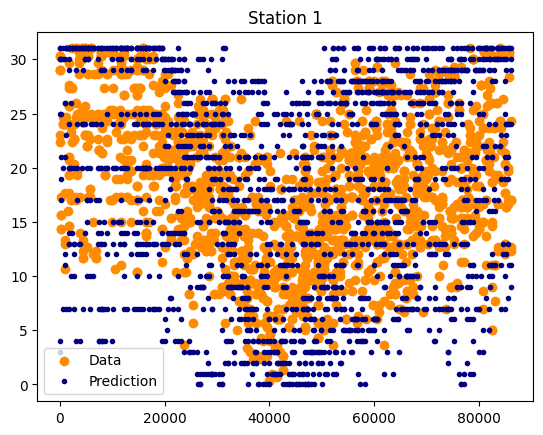

24.69208211143695
<class 'pandas.core.frame.DataFrame'> 1705 1705


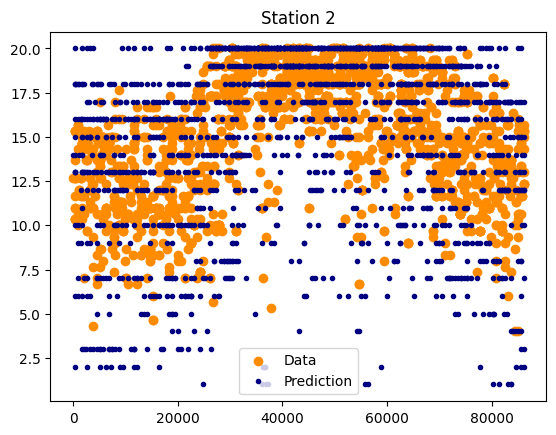

15.092290988056462
<class 'pandas.core.frame.DataFrame'> 1842 1842


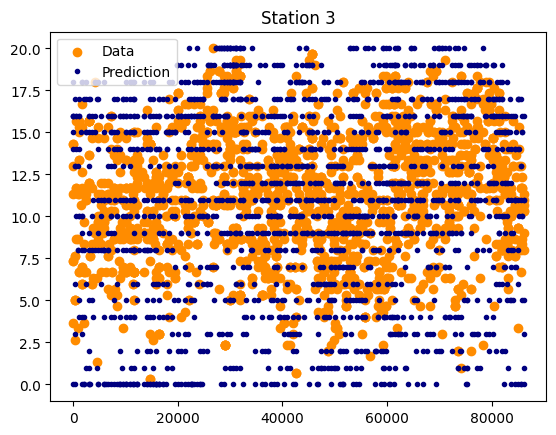

15.492957746478872
<class 'pandas.core.frame.DataFrame'> 1704 1704


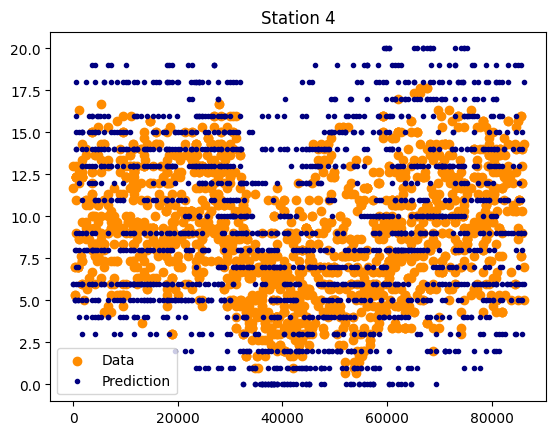

10.68007662835249
<class 'pandas.core.frame.DataFrame'> 2088 2088


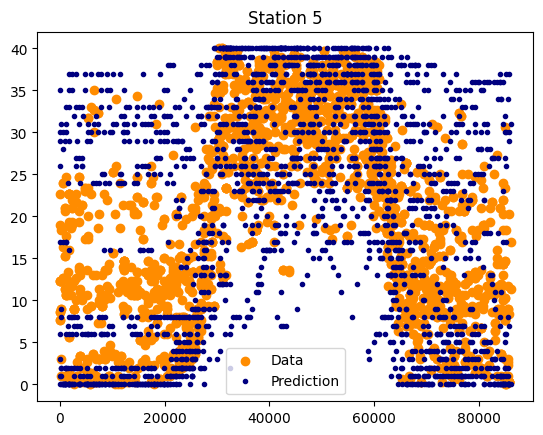

17.3043974871502
<class 'pandas.core.frame.DataFrame'> 1751 1751


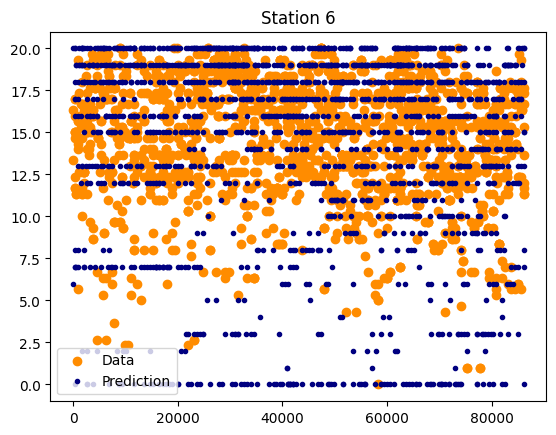

10.498220640569395
<class 'pandas.core.frame.DataFrame'> 1686 1686


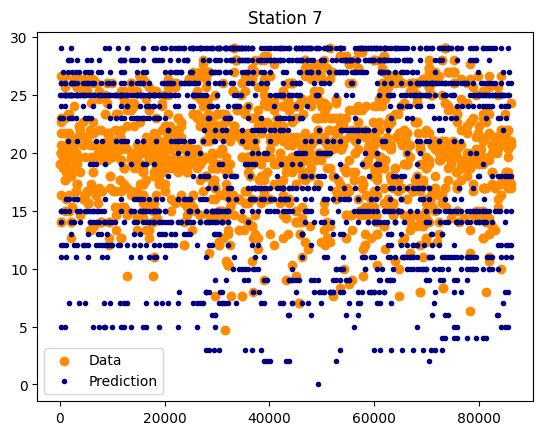

12.468577174459528
<class 'pandas.core.frame.DataFrame'> 1989 1989


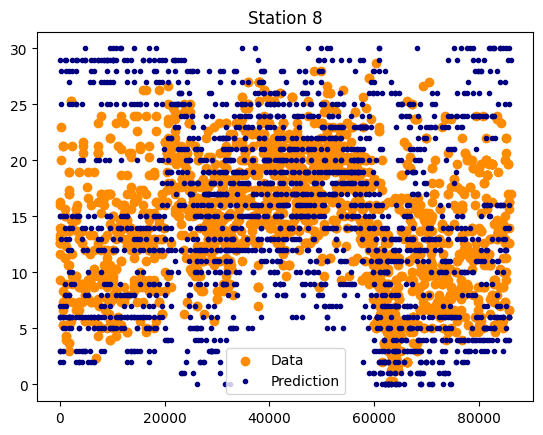

12.626506024096384
<class 'pandas.core.frame.DataFrame'> 2075 2075


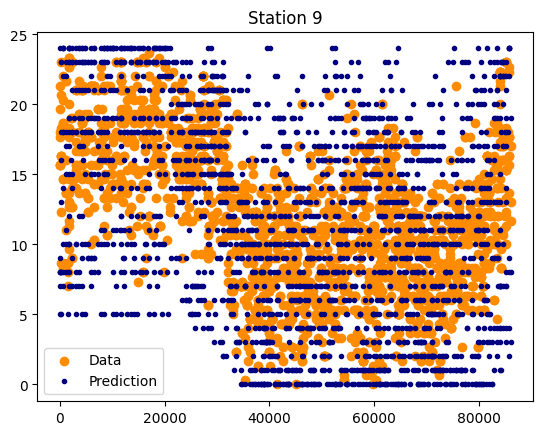

22.994652406417114
<class 'pandas.core.frame.DataFrame'> 1870 1870


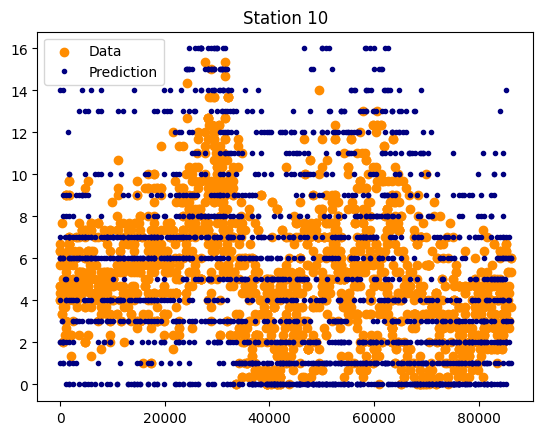

34.86020226055919
<class 'pandas.core.frame.DataFrame'> 1681 1681


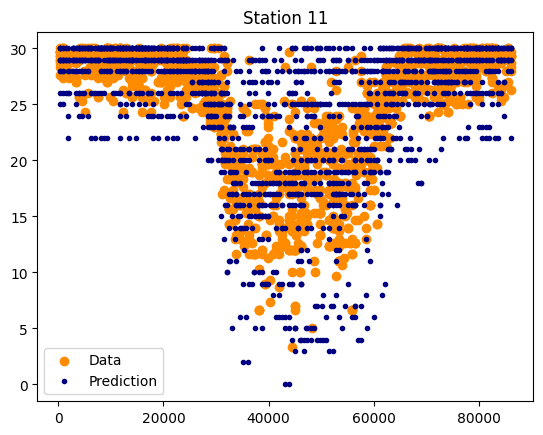

25.56615017878427
<class 'pandas.core.frame.DataFrame'> 1678 1678


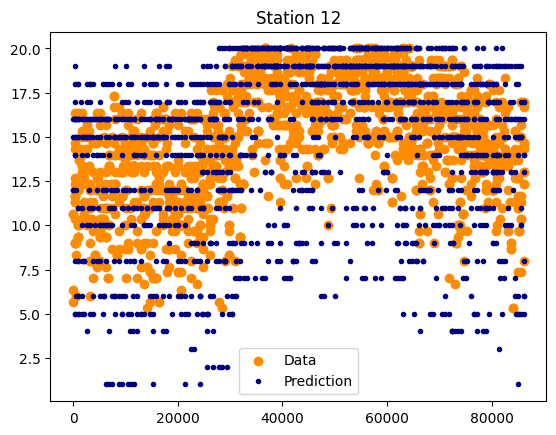

27.03030303030303
<class 'pandas.core.frame.DataFrame'> 1650 1650


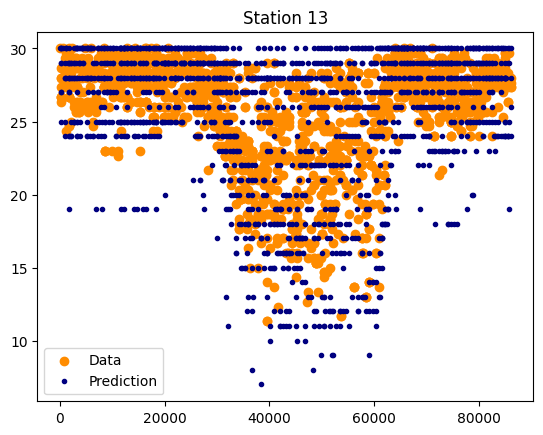

13.761467889908257
<class 'pandas.core.frame.DataFrame'> 1962 1962


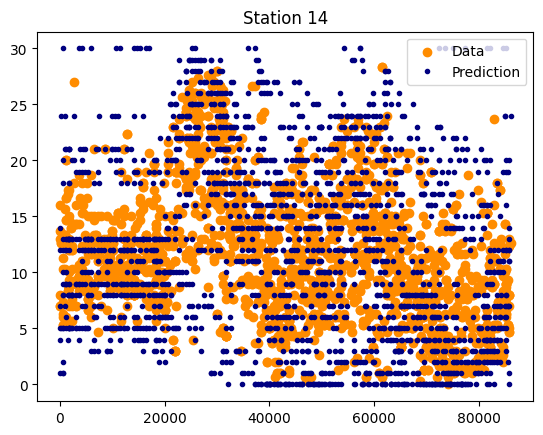

30.376028202115158
<class 'pandas.core.frame.DataFrame'> 1702 1702


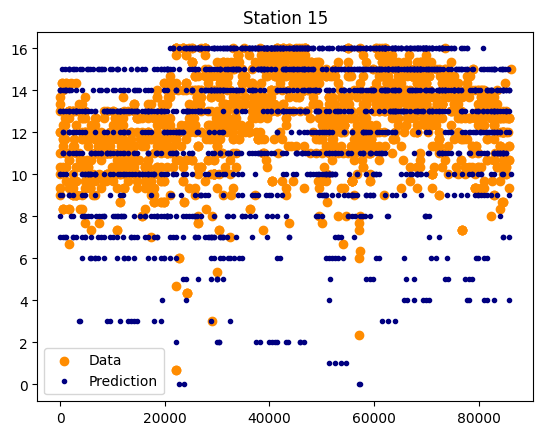

16.39072847682119
<class 'pandas.core.frame.DataFrame'> 1812 1812


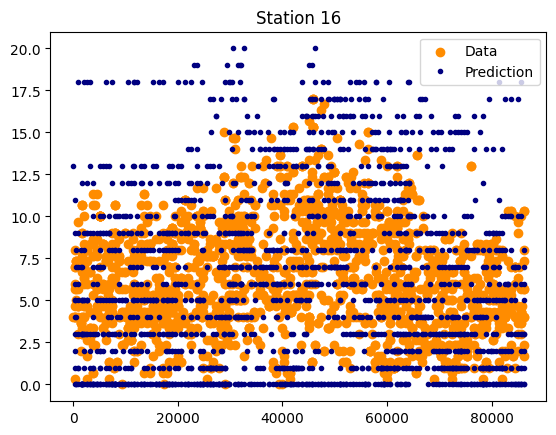

31.342400946185688
<class 'pandas.core.frame.DataFrame'> 1691 1691


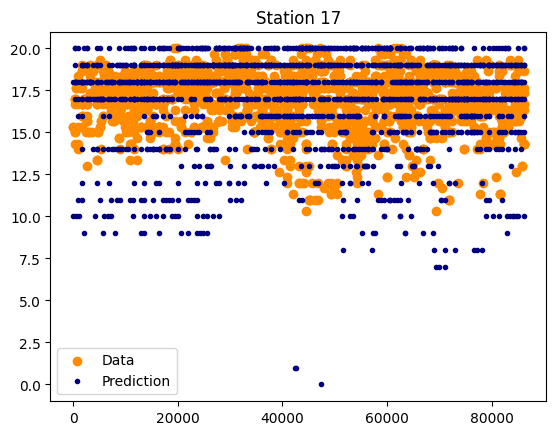

18.113017154389503
<class 'pandas.core.frame.DataFrame'> 1982 1982


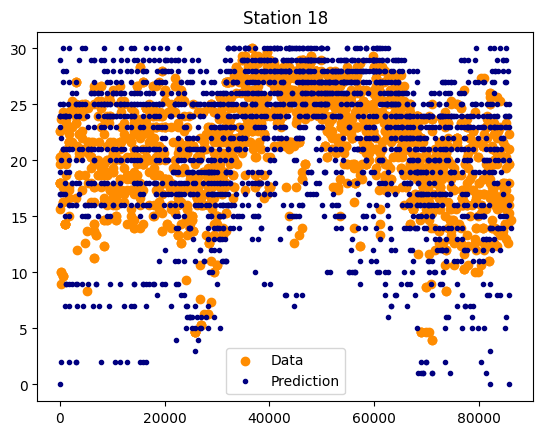

21.703163017031628
<class 'pandas.core.frame.DataFrame'> 2055 2055


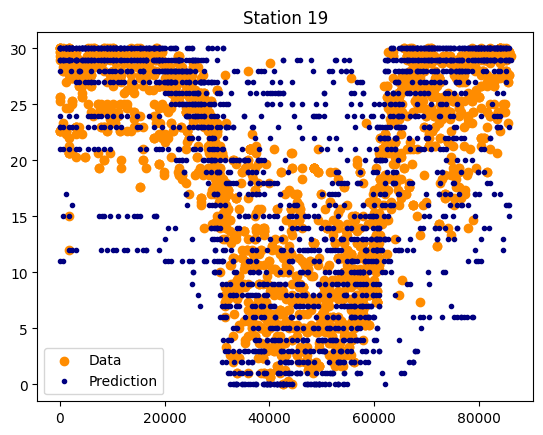

33.29473074696004
<class 'pandas.core.frame.DataFrame'> 1727 1727


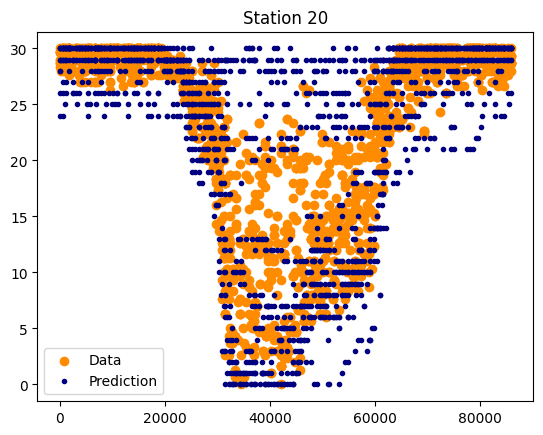

12.100576217915139
<class 'pandas.core.frame.DataFrame'> 1909 1909


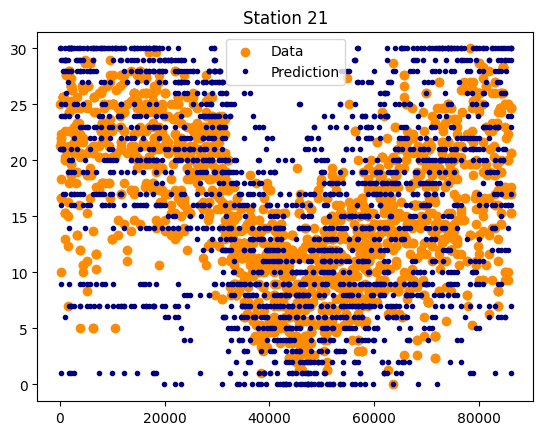

14.704370179948587
<class 'pandas.core.frame.DataFrame'> 1945 1945


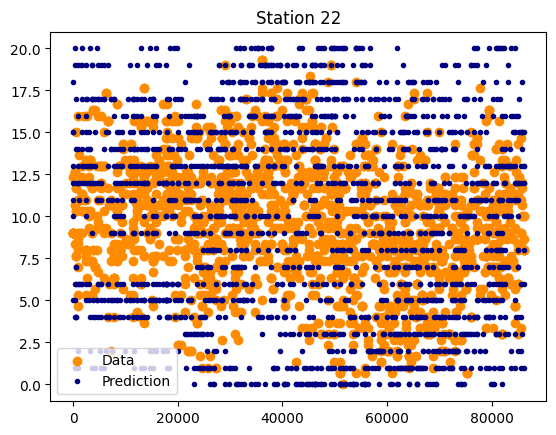

20.254506892895016
<class 'pandas.core.frame.DataFrame'> 1886 1886


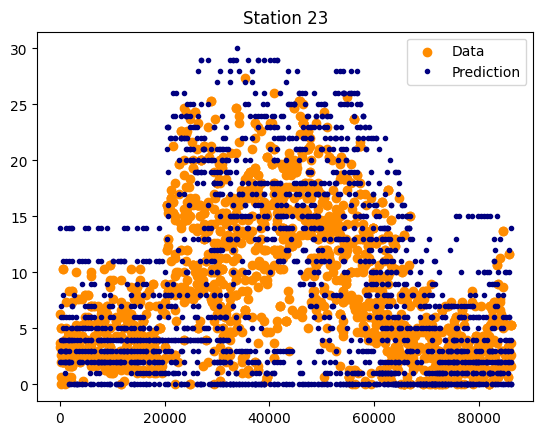

13.595166163141995
<class 'pandas.core.frame.DataFrame'> 1986 1986


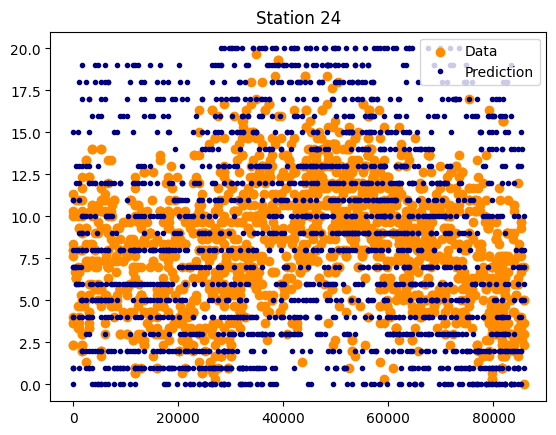

21.486643437862952
<class 'pandas.core.frame.DataFrame'> 1722 1722


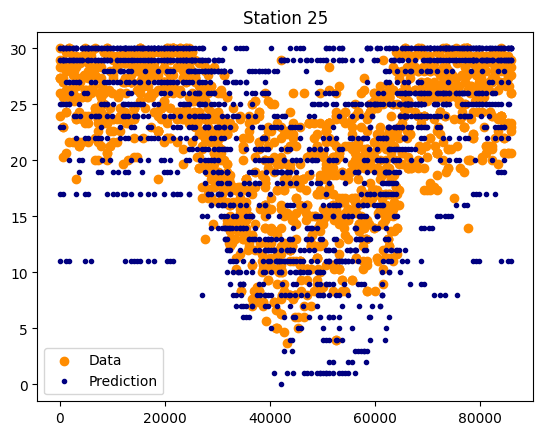

15.769017212659634
<class 'pandas.core.frame.DataFrame'> 1801 1801


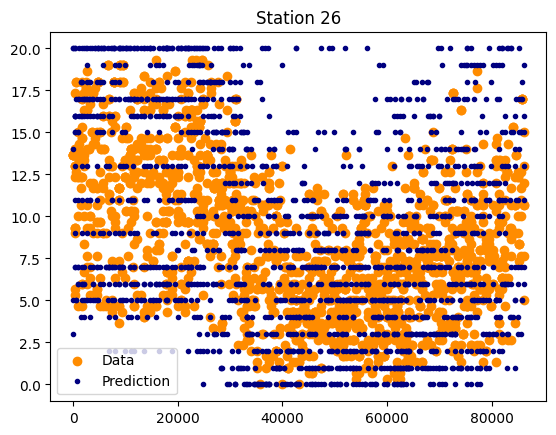

21.20404901438466
<class 'pandas.core.frame.DataFrame'> 1877 1877


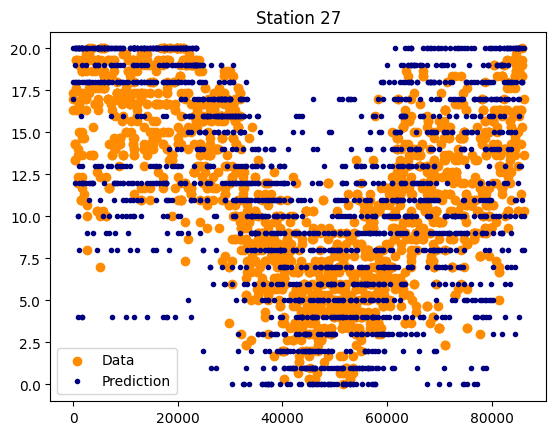

11.542669584245077
<class 'pandas.core.frame.DataFrame'> 1828 1828


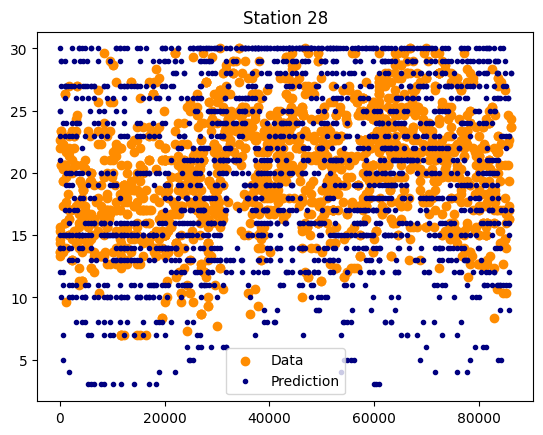

9.324596774193548
<class 'pandas.core.frame.DataFrame'> 1984 1984


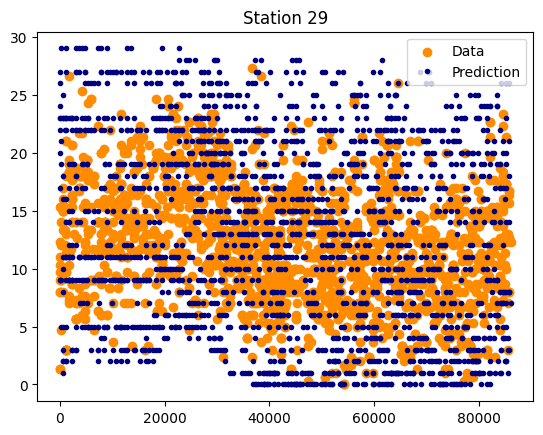

30.31815346225827
<class 'pandas.core.frame.DataFrame'> 1603 1603


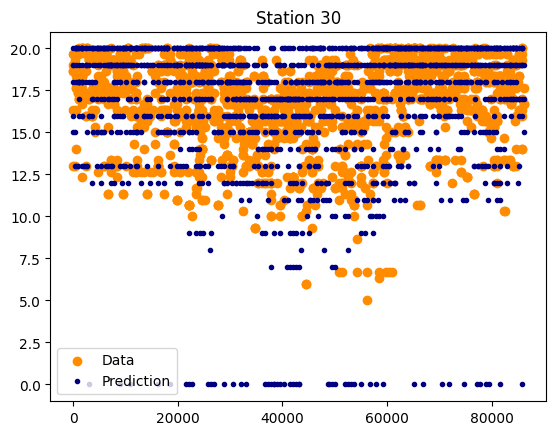

15.912636505460217
<class 'pandas.core.frame.DataFrame'> 1923 1923


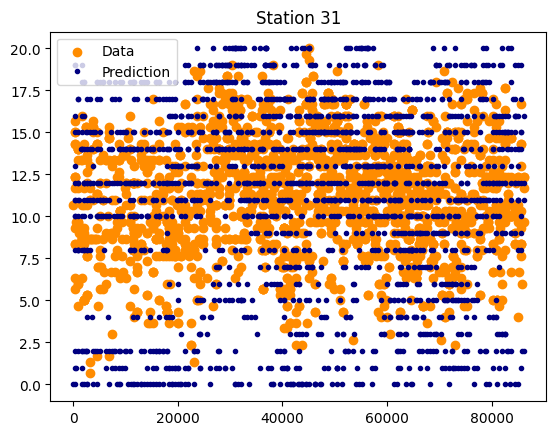

11.028315946348734
<class 'pandas.core.frame.DataFrame'> 2013 2013


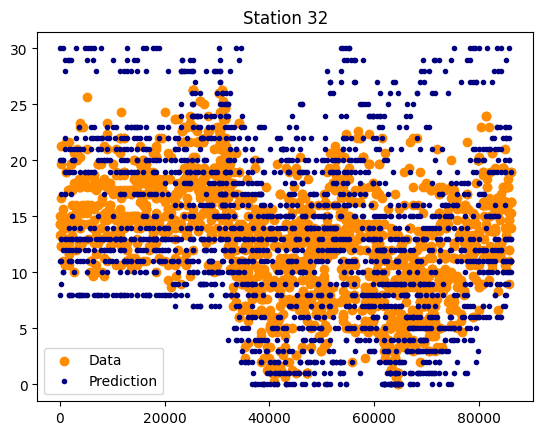

16.001877053026746
<class 'pandas.core.frame.DataFrame'> 2131 2131


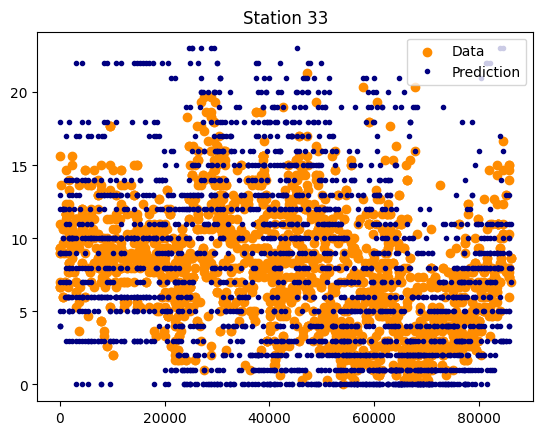

11.696471725471243
<class 'pandas.core.frame.DataFrame'> 2069 2069


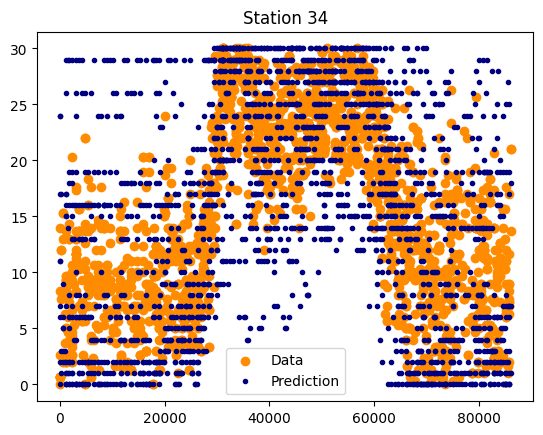

12.570839773312725
<class 'pandas.core.frame.DataFrame'> 1941 1941


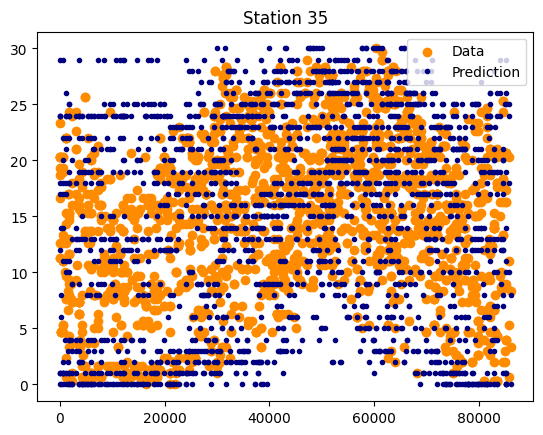

10.317902955939767
<class 'pandas.core.frame.DataFrame'> 1793 1793


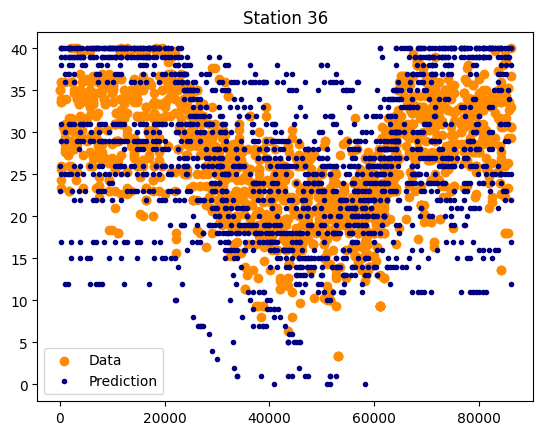

24.38118811881188
<class 'pandas.core.frame.DataFrame'> 1616 1616


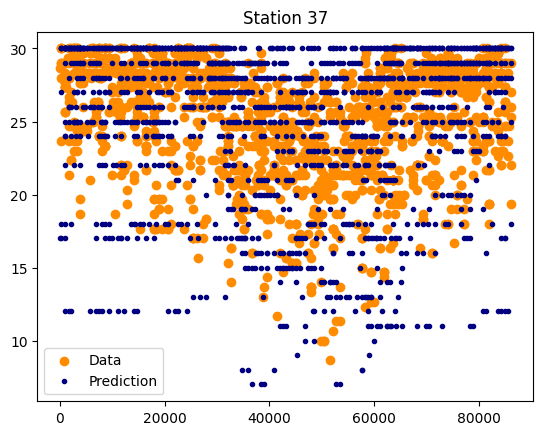

12.432697014194812
<class 'pandas.core.frame.DataFrame'> 2043 2043


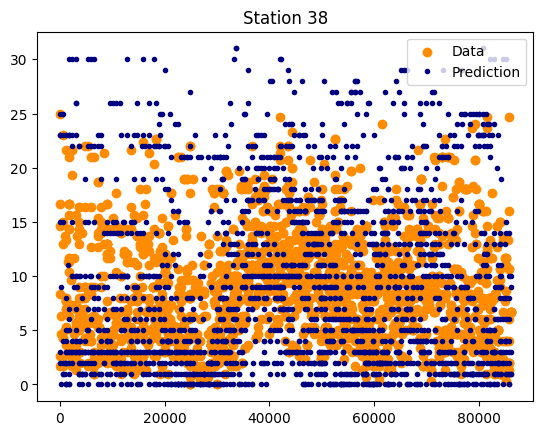

22.182377049180328
<class 'pandas.core.frame.DataFrame'> 1952 1952


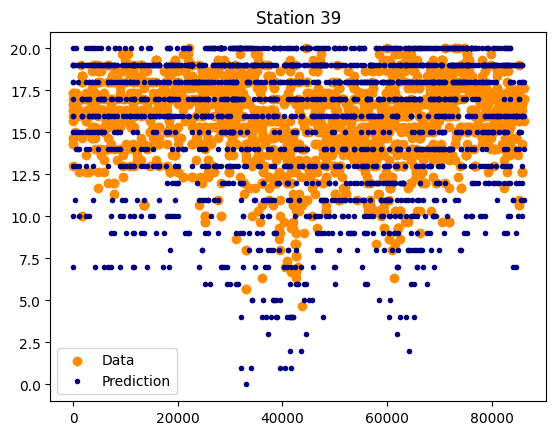

13.153724247226625
<class 'pandas.core.frame.DataFrame'> 1893 1893


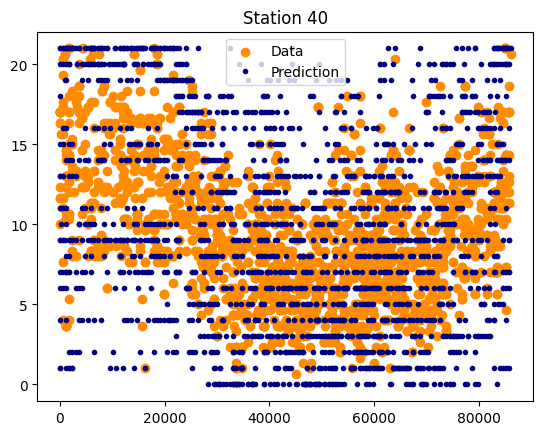

22.917897223862965
<class 'pandas.core.frame.DataFrame'> 1693 1693


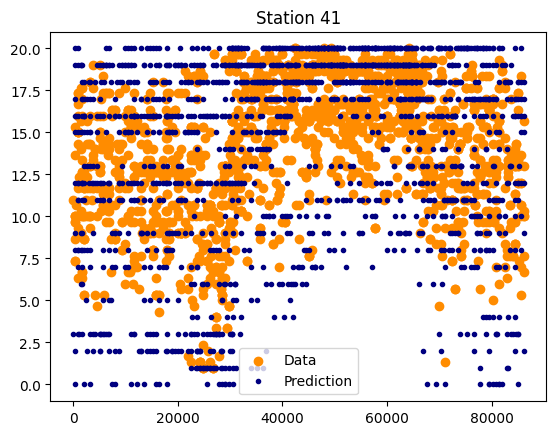

19.535374868004222
<class 'pandas.core.frame.DataFrame'> 1894 1894


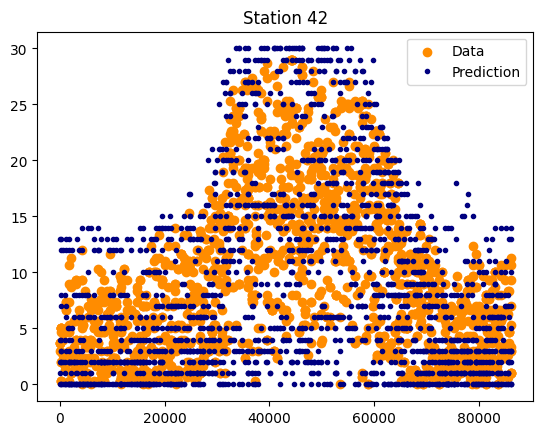

11.76470588235294
<class 'pandas.core.frame.DataFrame'> 1836 1836


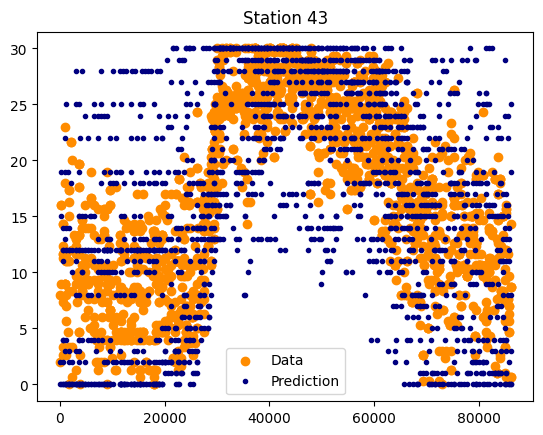

20.73101085094232
<class 'pandas.core.frame.DataFrame'> 1751 1751


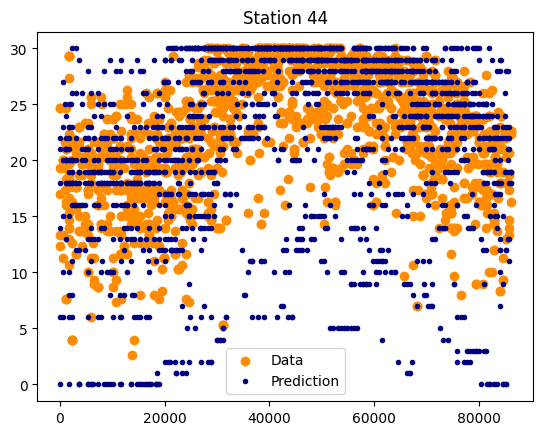

8.961996596710154
<class 'pandas.core.frame.DataFrame'> 1763 1763


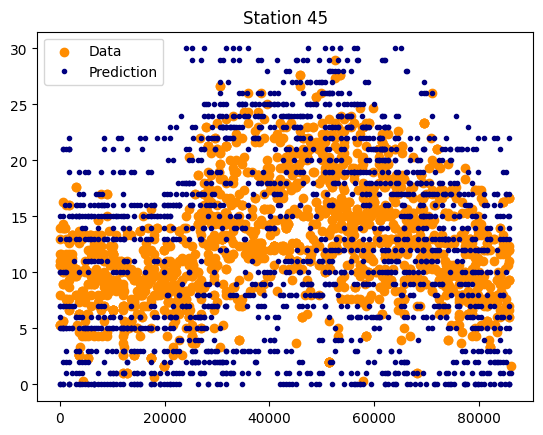

30.175015087507546
<class 'pandas.core.frame.DataFrame'> 1657 1657


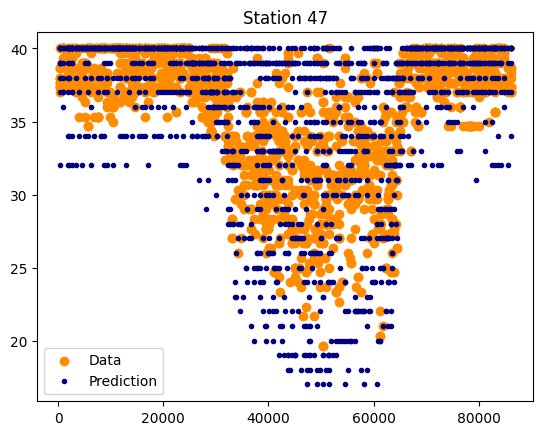

9.464575446187128
<class 'pandas.core.frame.DataFrame'> 1849 1849


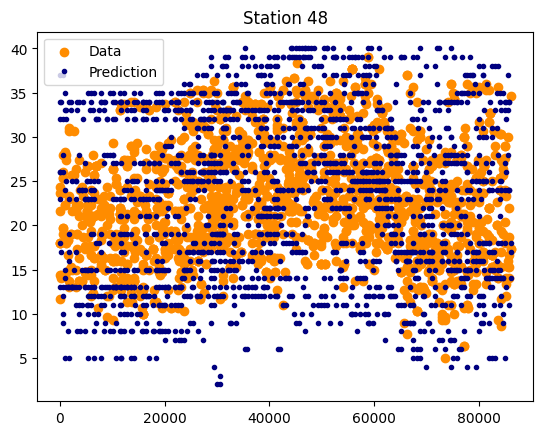

10.18981018981019
<class 'pandas.core.frame.DataFrame'> 2002 2002


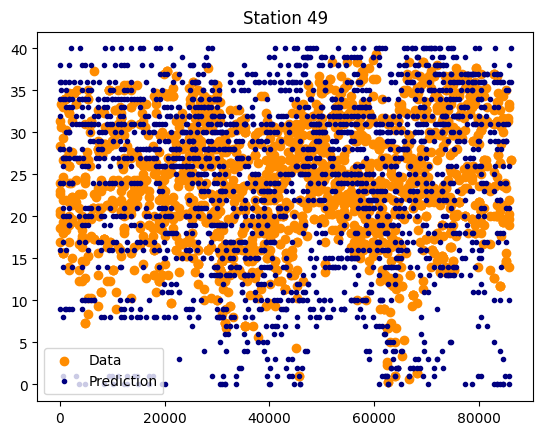

12.796697626418988
<class 'pandas.core.frame.DataFrame'> 1938 1938


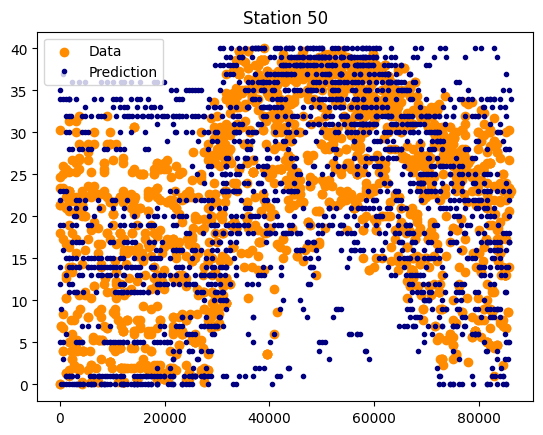

14.024749558043606
<class 'pandas.core.frame.DataFrame'> 1697 1697


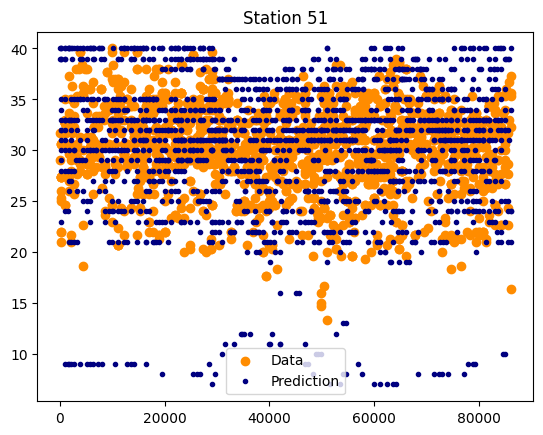

16.9811320754717
<class 'pandas.core.frame.DataFrame'> 1590 1590


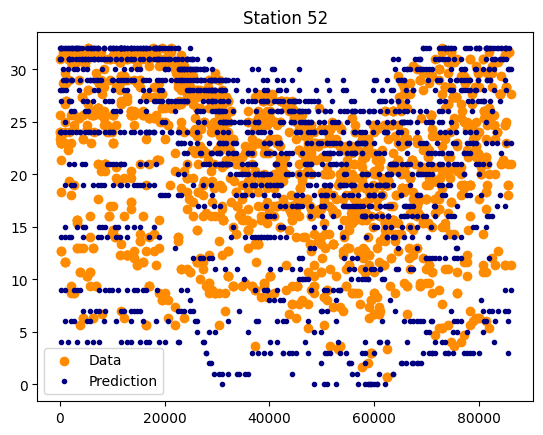

23.25
<class 'pandas.core.frame.DataFrame'> 1600 1600


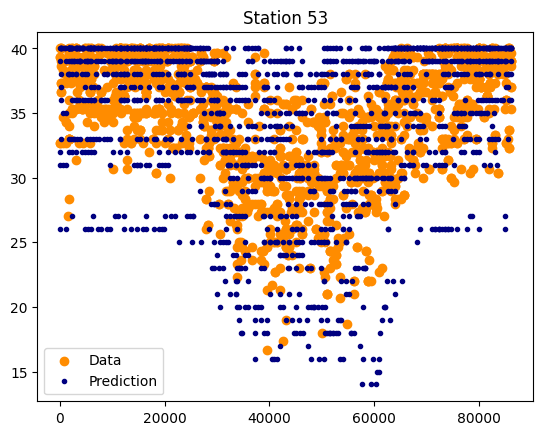

12.608948285880302
<class 'pandas.core.frame.DataFrame'> 1721 1721


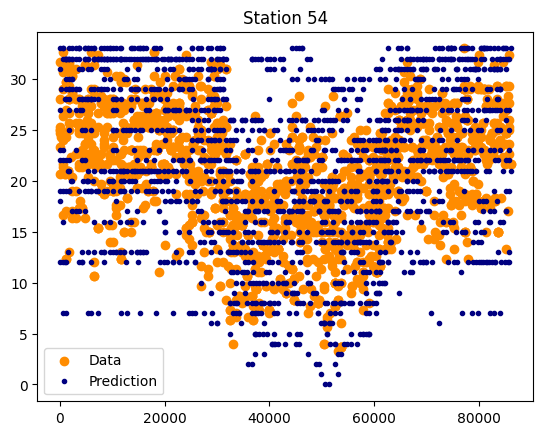

31.84257602862254
<class 'pandas.core.frame.DataFrame'> 1677 1677


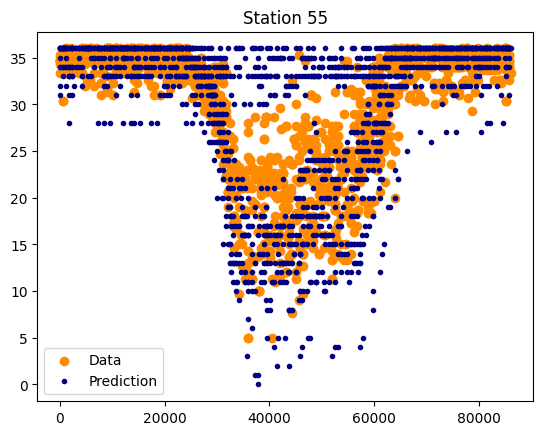

10.35366478728857
<class 'pandas.core.frame.DataFrame'> 1951 1951


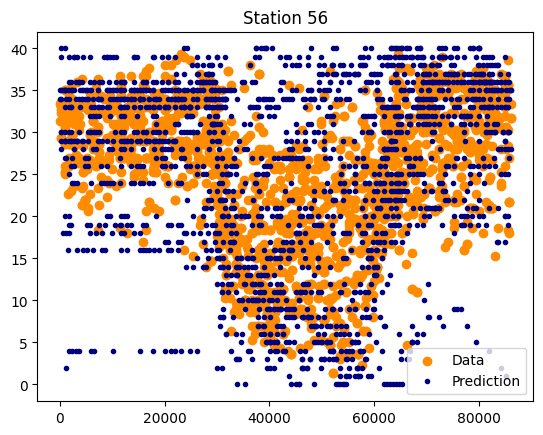

16.19217081850534
<class 'pandas.core.frame.DataFrame'> 1686 1686


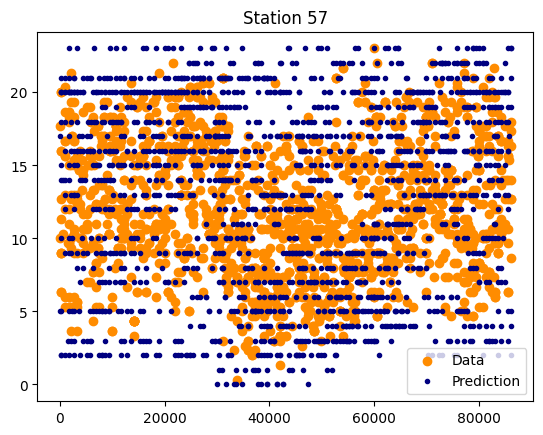

9.546769527483125
<class 'pandas.core.frame.DataFrame'> 2074 2074


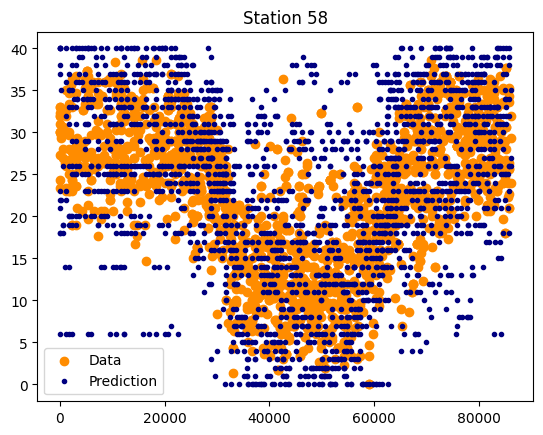

28.3175355450237
<class 'pandas.core.frame.DataFrame'> 1688 1688


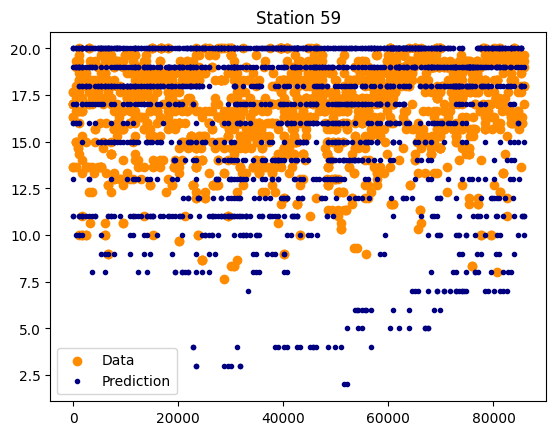

13.09278350515464
<class 'pandas.core.frame.DataFrame'> 1940 1940


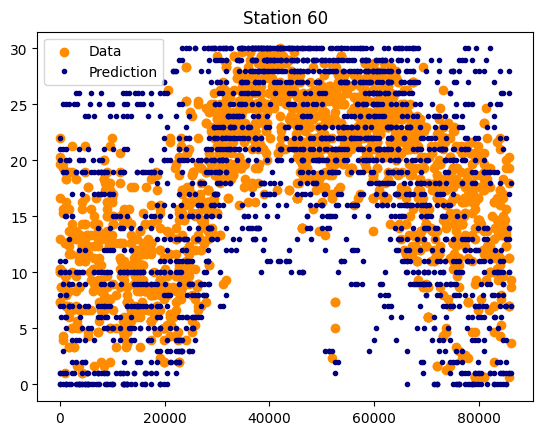

28.69352869352869
<class 'pandas.core.frame.DataFrame'> 1638 1638


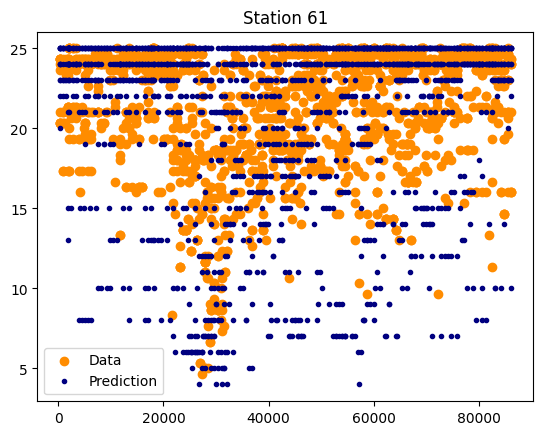

13.18206374932469
<class 'pandas.core.frame.DataFrame'> 1851 1851


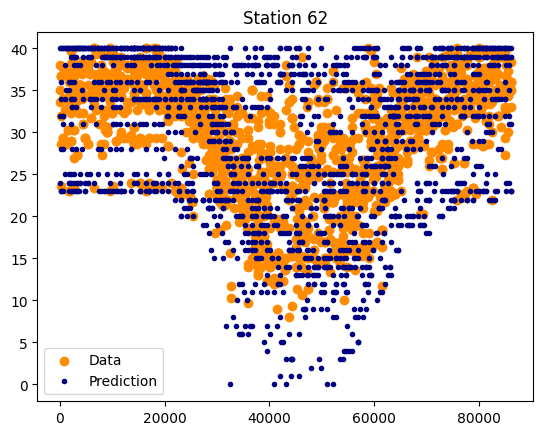

12.171970965940815
<class 'pandas.core.frame.DataFrame'> 1791 1791


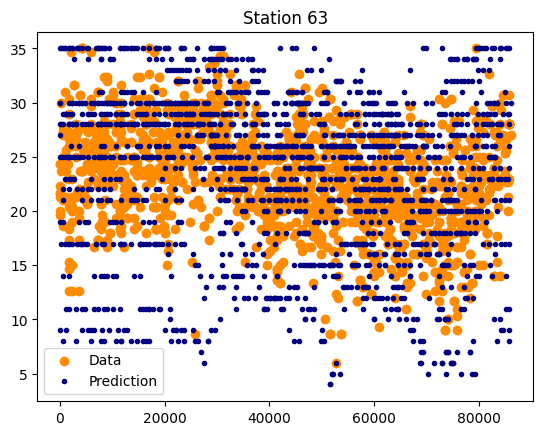

8.972352634324466
<class 'pandas.core.frame.DataFrame'> 1917 1917


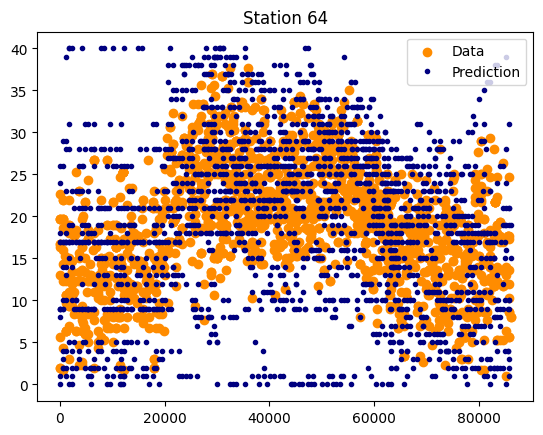

22.060606060606062
<class 'pandas.core.frame.DataFrame'> 1650 1650


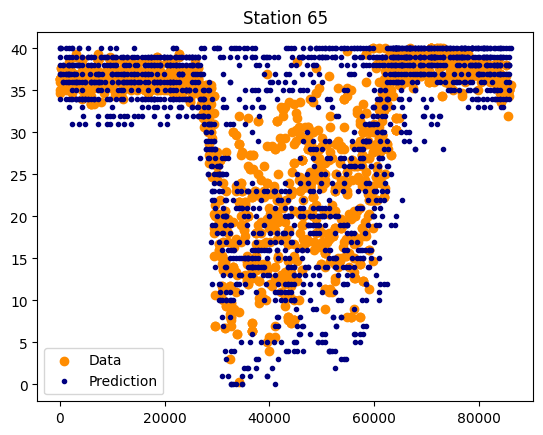

14.308768154922
<class 'pandas.core.frame.DataFrame'> 1859 1859


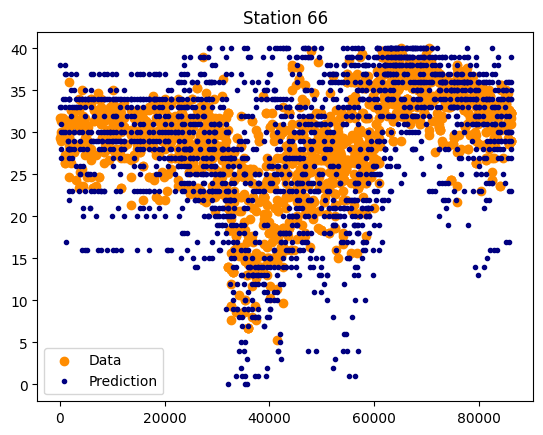

9.466865969108122
<class 'pandas.core.frame.DataFrame'> 2007 2007


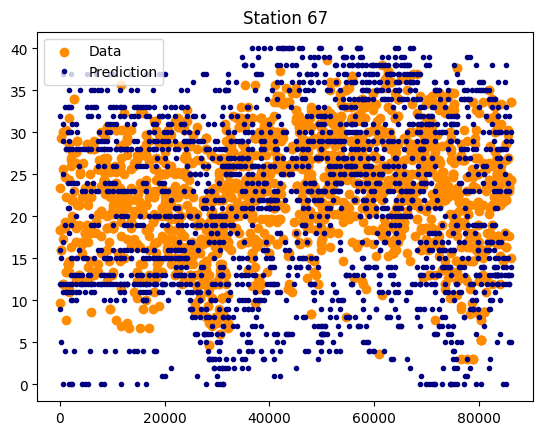

10.104011887072808
<class 'pandas.core.frame.DataFrame'> 2019 2019


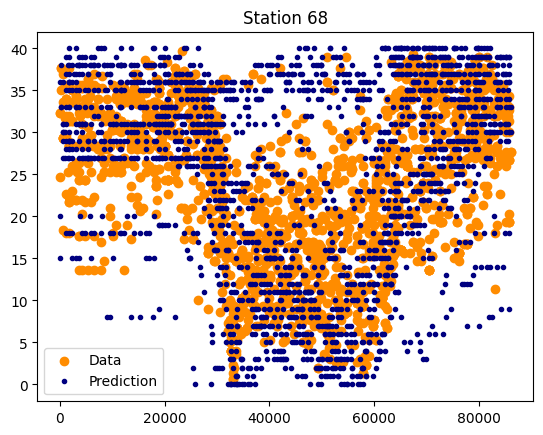

9.826589595375722
<class 'pandas.core.frame.DataFrame'> 2249 2249


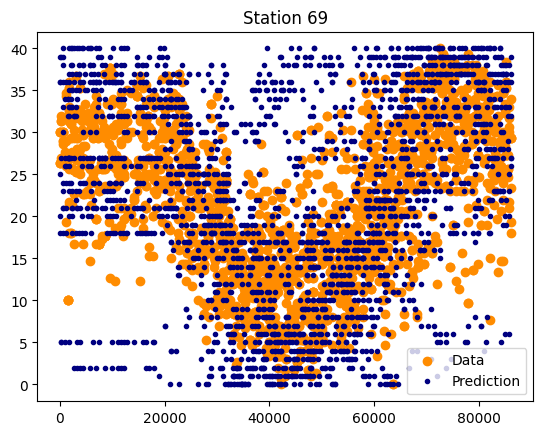

18.05094130675526
<class 'pandas.core.frame.DataFrame'> 1806 1806


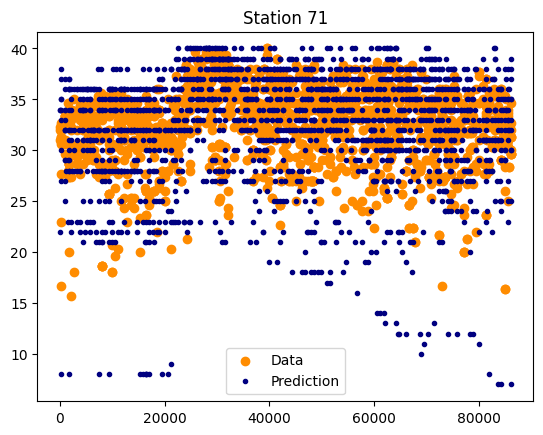

16.591422121896162
<class 'pandas.core.frame.DataFrame'> 1772 1772


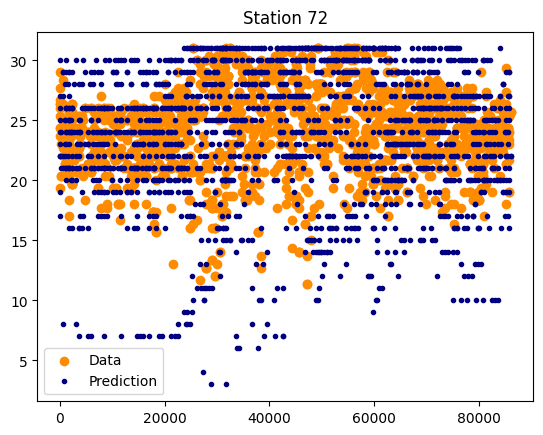

19.902650081124932
<class 'pandas.core.frame.DataFrame'> 1849 1849


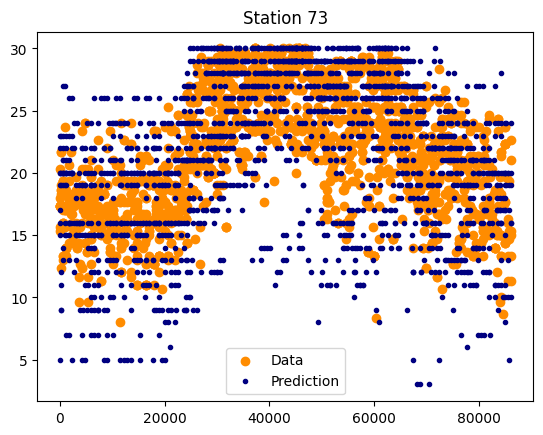

11.500862564692351
<class 'pandas.core.frame.DataFrame'> 1739 1739


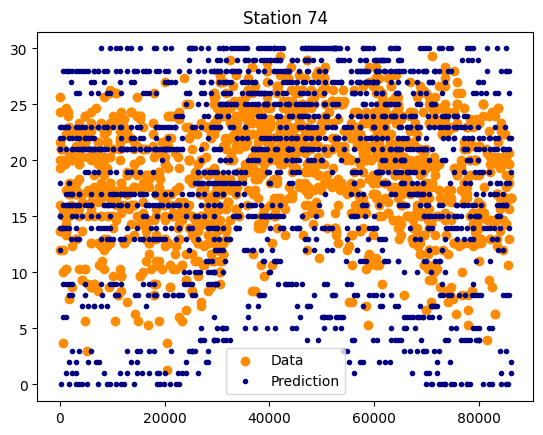

10.587583148558759
<class 'pandas.core.frame.DataFrame'> 1804 1804


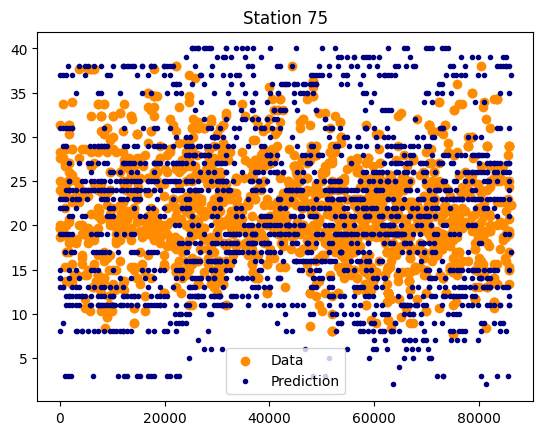

13.36056009334889
<class 'pandas.core.frame.DataFrame'> 1714 1714


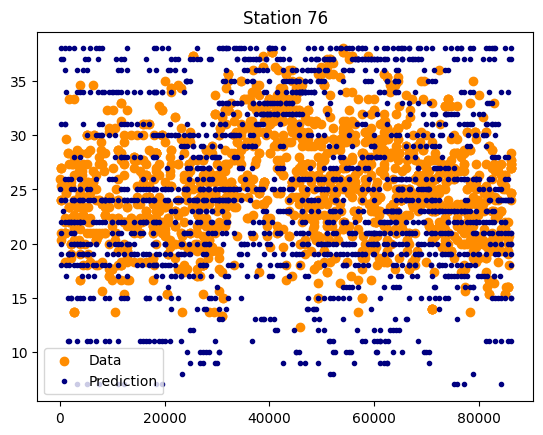

10.92572658772874
<class 'pandas.core.frame.DataFrame'> 1858 1858


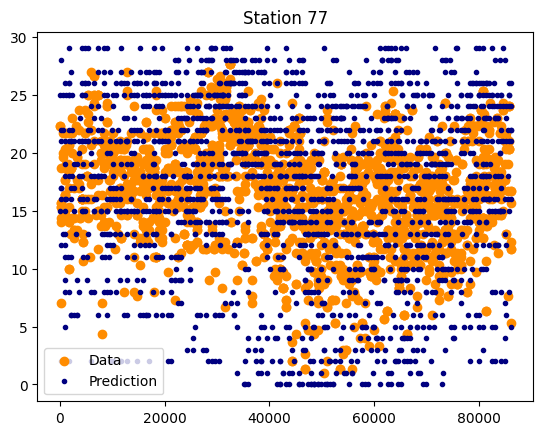

11.384439359267734
<class 'pandas.core.frame.DataFrame'> 1748 1748


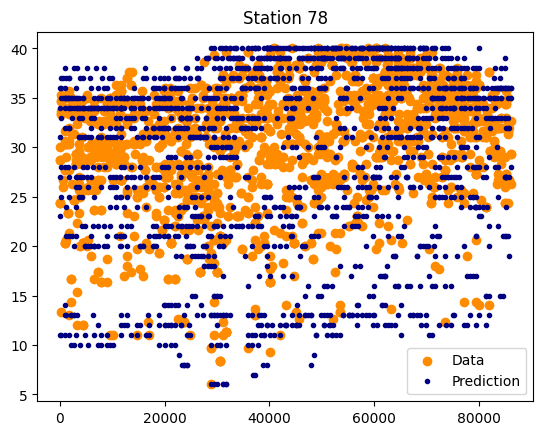

32.1882951653944
<class 'pandas.core.frame.DataFrame'> 1572 1572


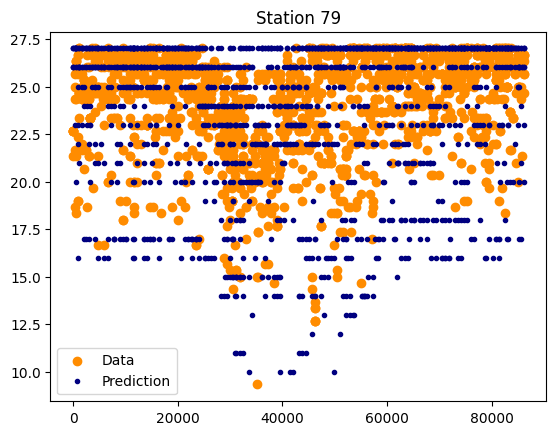

9.988584474885846
<class 'pandas.core.frame.DataFrame'> 1752 1752


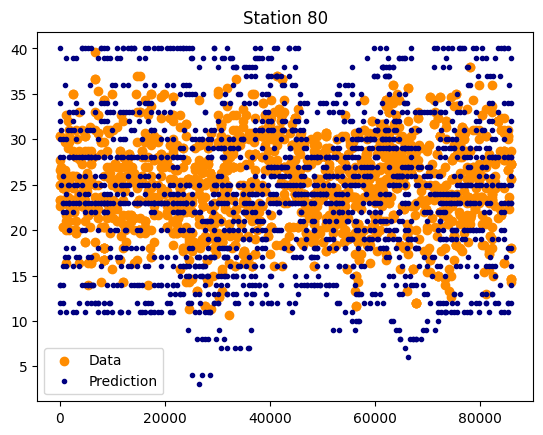

21.317588564325668
<class 'pandas.core.frame.DataFrame'> 1609 1609


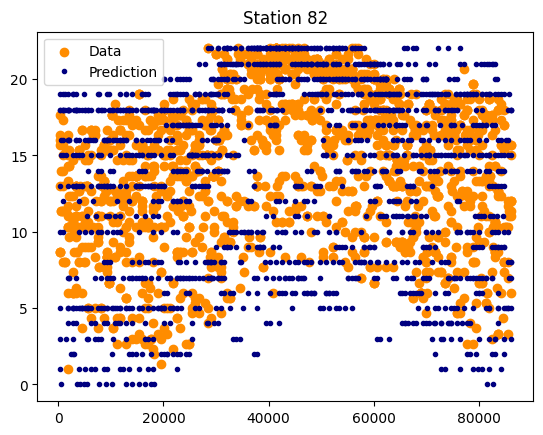

10.10332950631458
<class 'pandas.core.frame.DataFrame'> 1742 1742


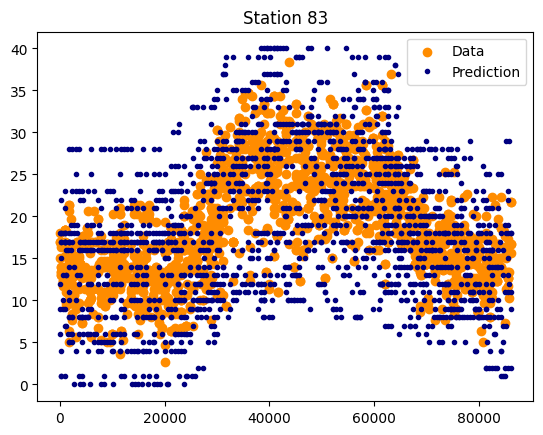

13.172205438066465
<class 'pandas.core.frame.DataFrame'> 1655 1655


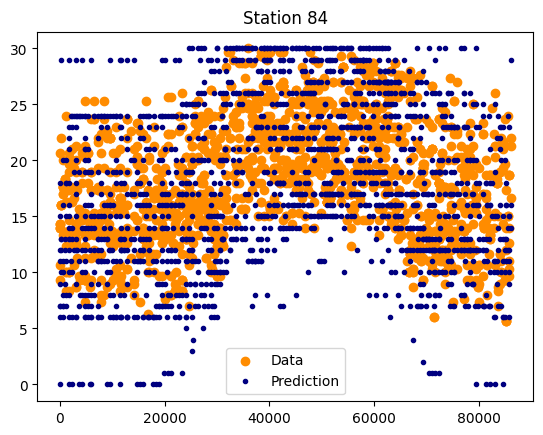

10.981987216734456
<class 'pandas.core.frame.DataFrame'> 1721 1721


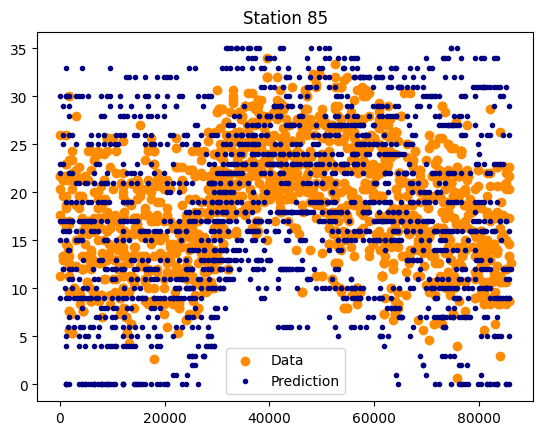

11.445459430413756
<class 'pandas.core.frame.DataFrame'> 1861 1861


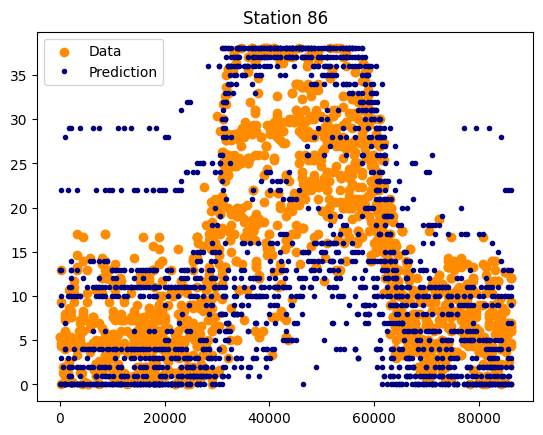

9.988518943742825
<class 'pandas.core.frame.DataFrame'> 1742 1742


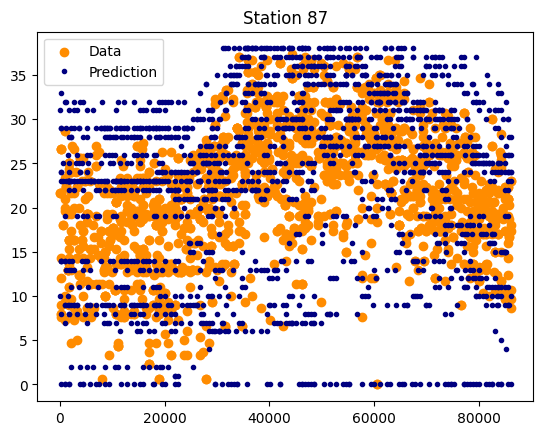

15.959821428571427
<class 'pandas.core.frame.DataFrame'> 1792 1792


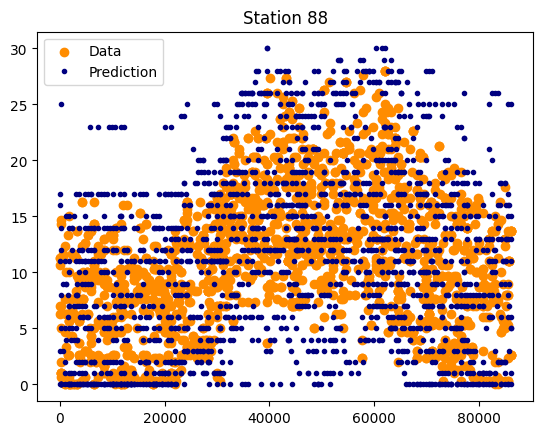

46.02977667493796
<class 'pandas.core.frame.DataFrame'> 1612 1612


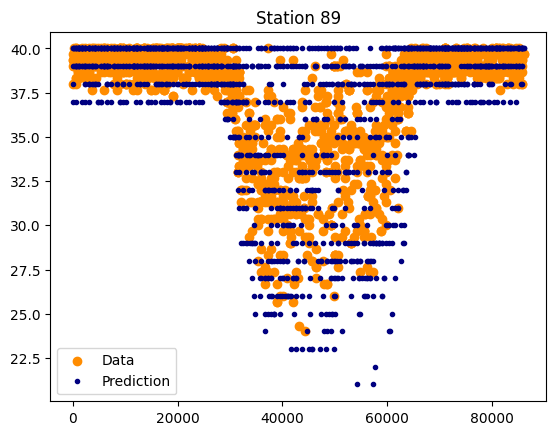

14.495028780743066
<class 'pandas.core.frame.DataFrame'> 1911 1911


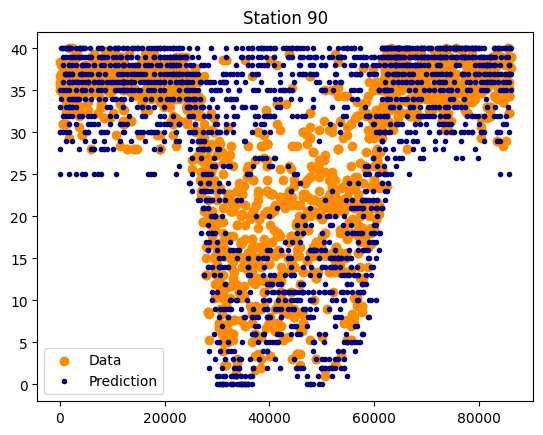

10.967098703888336
<class 'pandas.core.frame.DataFrame'> 2006 2006


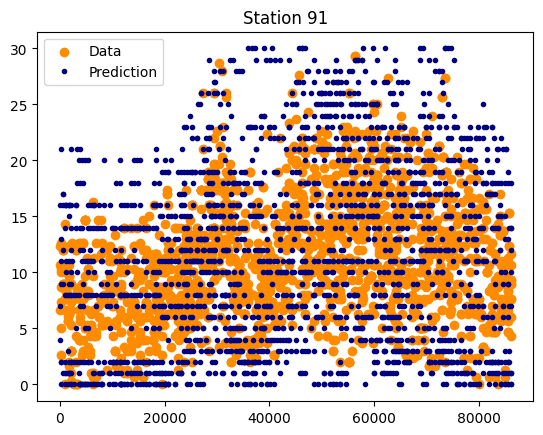

14.065934065934066
<class 'pandas.core.frame.DataFrame'> 1820 1820


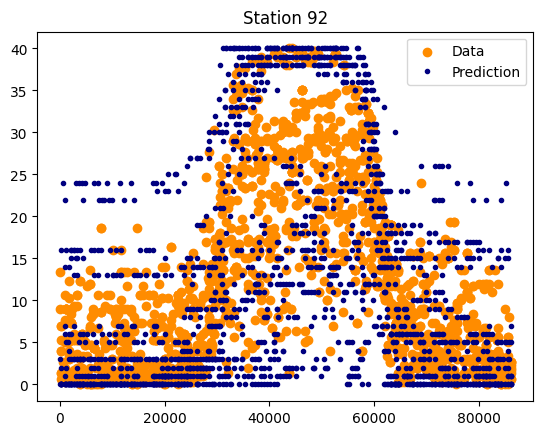

15.421686746987953
<class 'pandas.core.frame.DataFrame'> 1660 1660


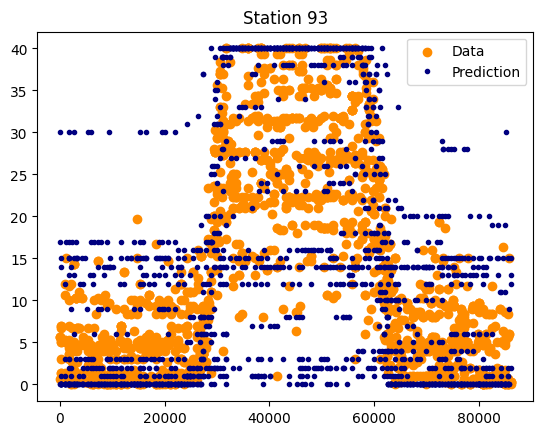

13.358070500927644
<class 'pandas.core.frame.DataFrame'> 1617 1617


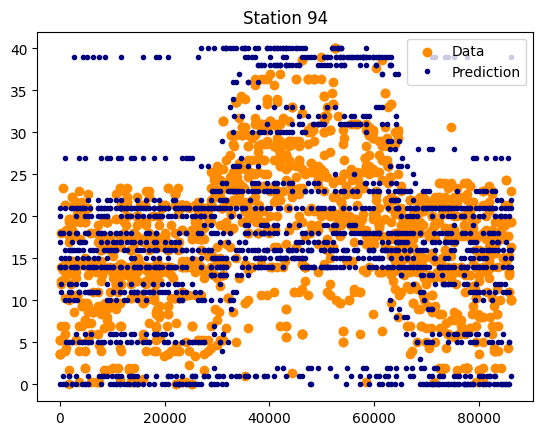

9.135399673735726
<class 'pandas.core.frame.DataFrame'> 1839 1839


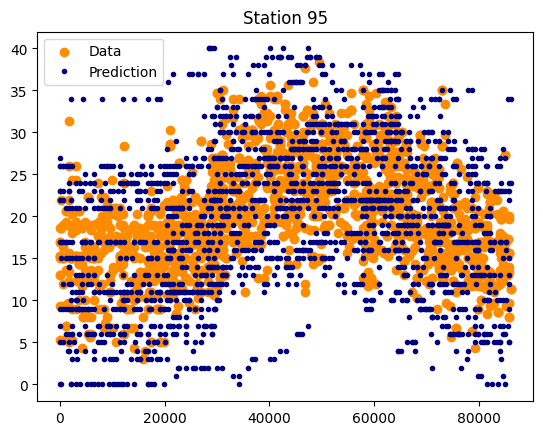

9.509011808576757
<class 'pandas.core.frame.DataFrame'> 1609 1609


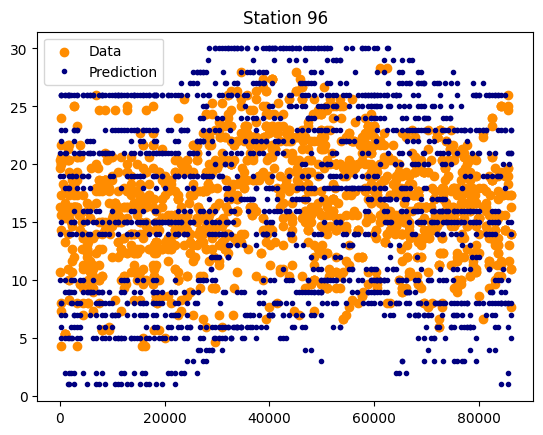

9.454136184580754
<class 'pandas.core.frame.DataFrame'> 1777 1777


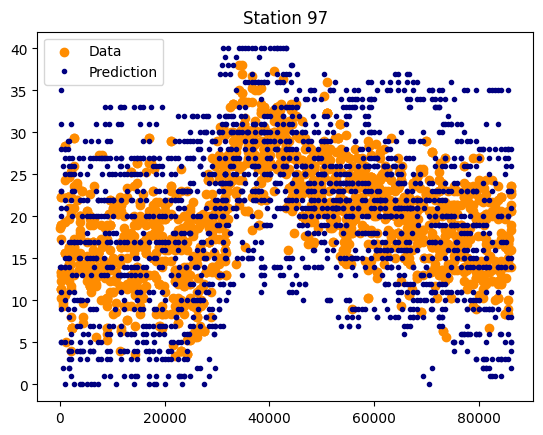

9.212050984936269
<class 'pandas.core.frame.DataFrame'> 1726 1726


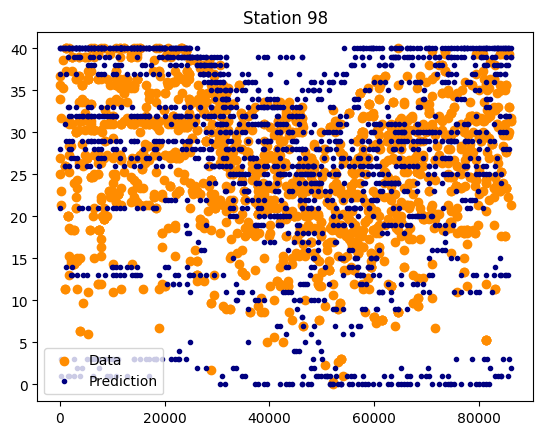

16.502033701336433
<class 'pandas.core.frame.DataFrame'> 1721 1721


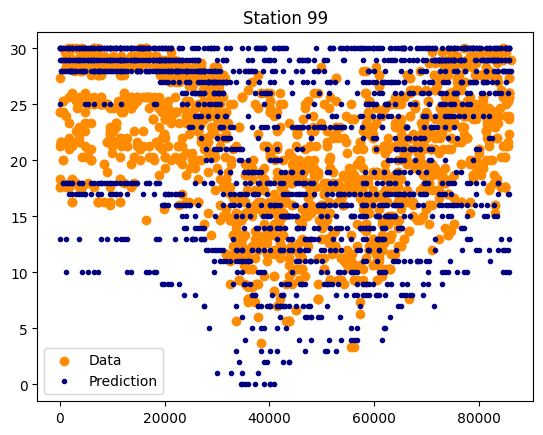

20.462046204620464
<class 'pandas.core.frame.DataFrame'> 1818 1818


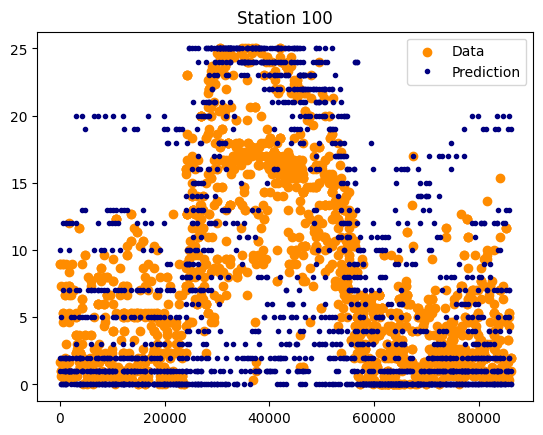

20.044296788482836
<class 'pandas.core.frame.DataFrame'> 1806 1806


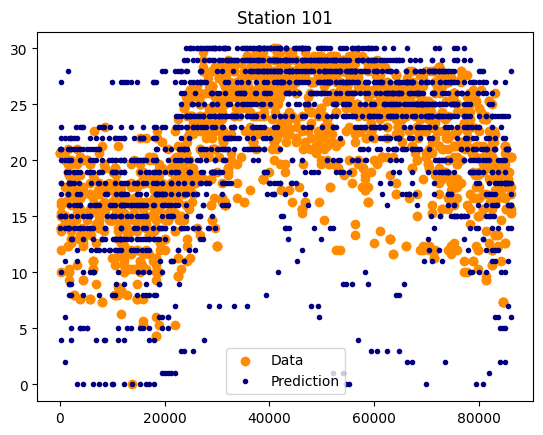

11.761194029850747
<class 'pandas.core.frame.DataFrame'> 1675 1675


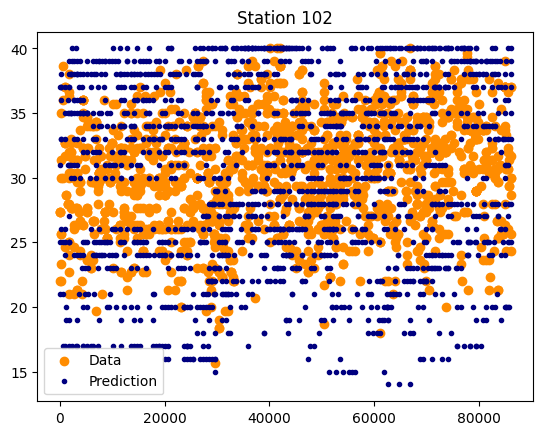

23.254401942926535
<class 'pandas.core.frame.DataFrame'> 1647 1647


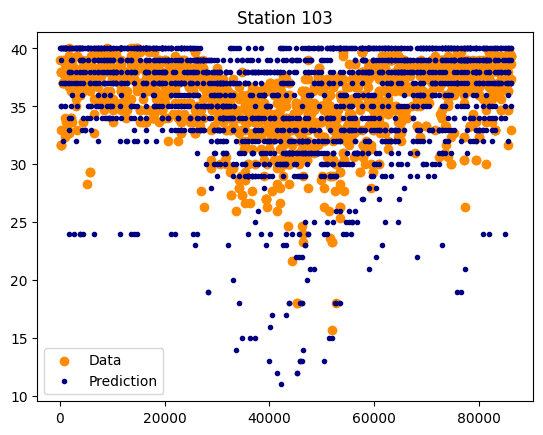

12.443584784010316
<class 'pandas.core.frame.DataFrame'> 1551 1551


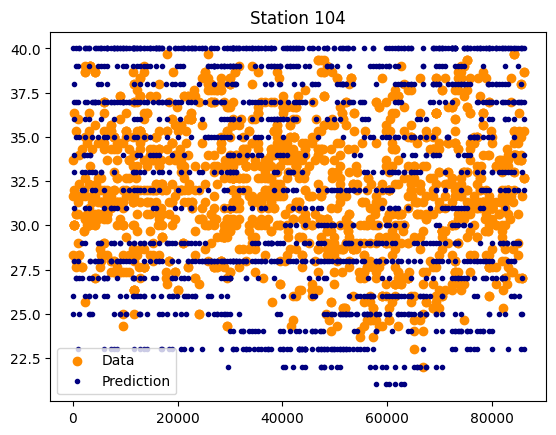

14.73551637279597
<class 'pandas.core.frame.DataFrame'> 1588 1588


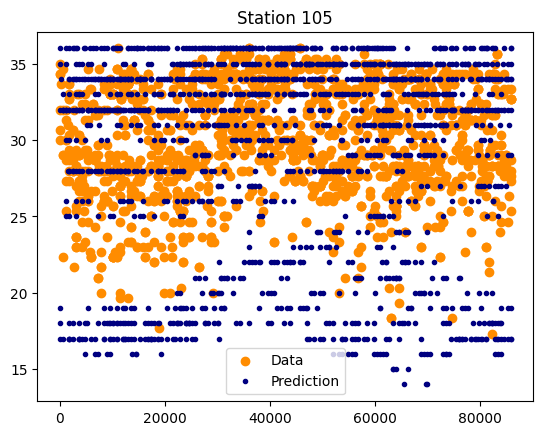

12.14114832535885
<class 'pandas.core.frame.DataFrame'> 1672 1672


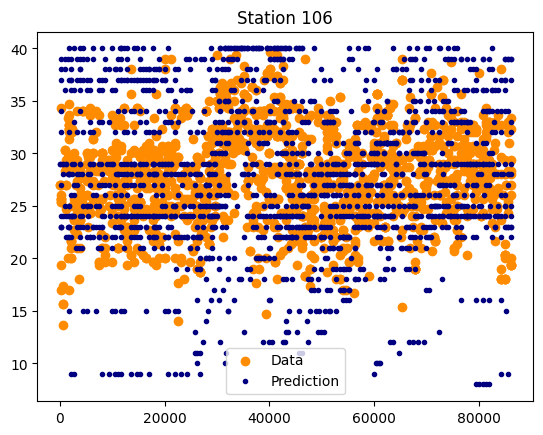

10.07527504342791
<class 'pandas.core.frame.DataFrame'> 1727 1727


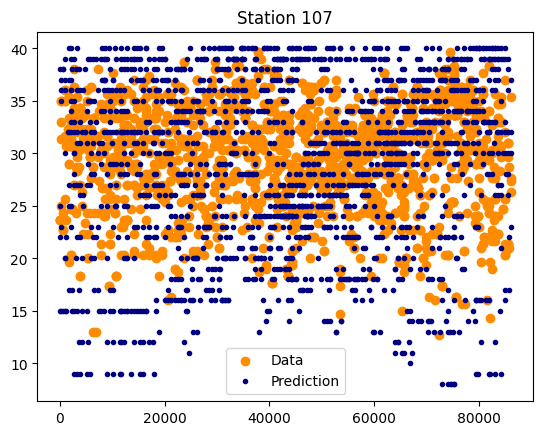

14.202898550724639
<class 'pandas.core.frame.DataFrame'> 1725 1725


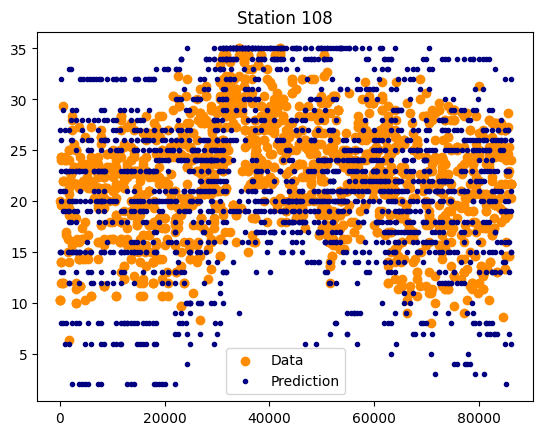

14.672686230248308
<class 'pandas.core.frame.DataFrame'> 1772 1772


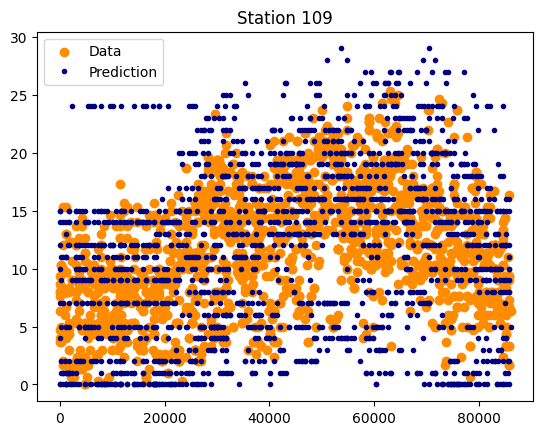

13.361294188136608
<class 'pandas.core.frame.DataFrame'> 1669 1669


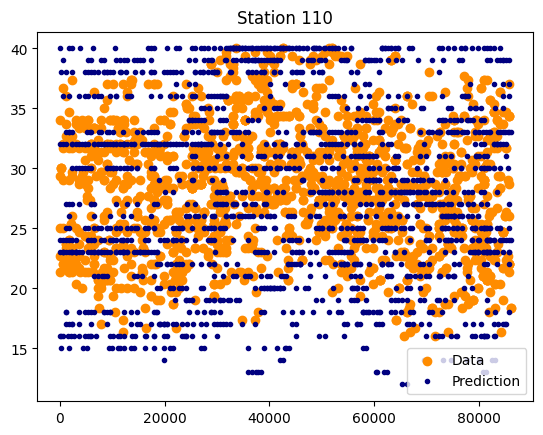

37.71587743732591
<class 'pandas.core.frame.DataFrame'> 1795 1795


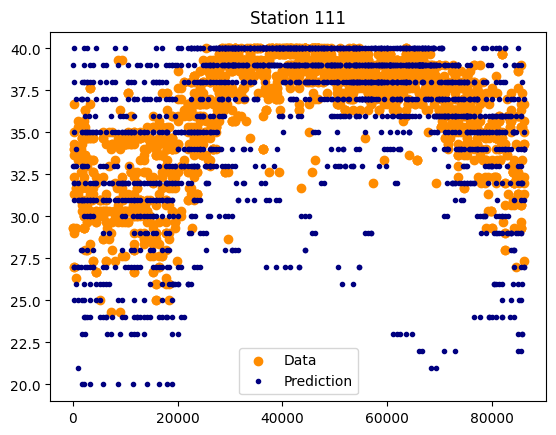

15.754132231404958
<class 'pandas.core.frame.DataFrame'> 1936 1936


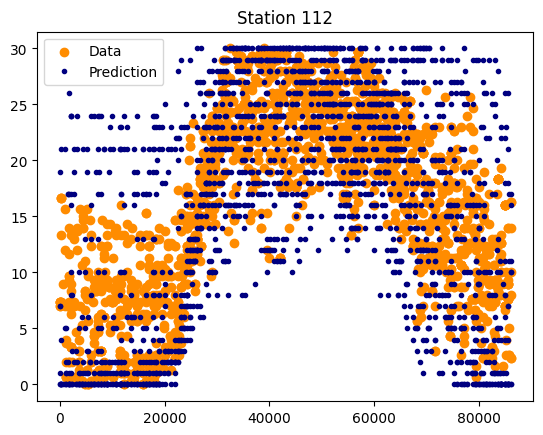

24.204616344354335
<class 'pandas.core.frame.DataFrame'> 1603 1603


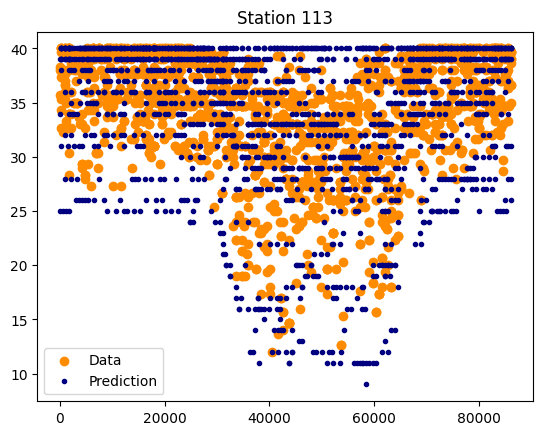

22.109207708779444
<class 'pandas.core.frame.DataFrame'> 1868 1868


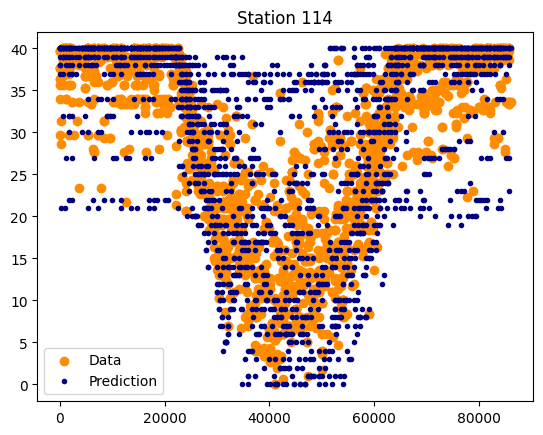

25.089974293059125
<class 'pandas.core.frame.DataFrame'> 1945 1945


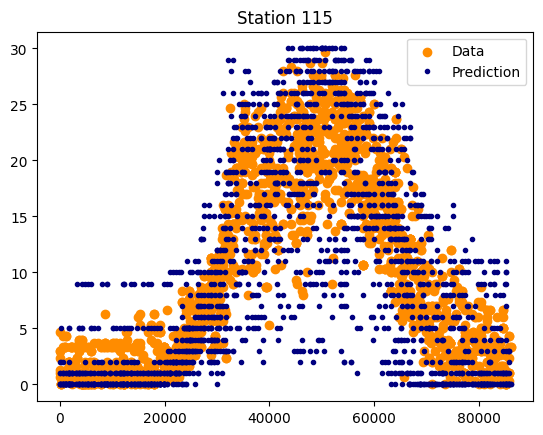

20.694006309148268
<class 'pandas.core.frame.DataFrame'> 1585 1585


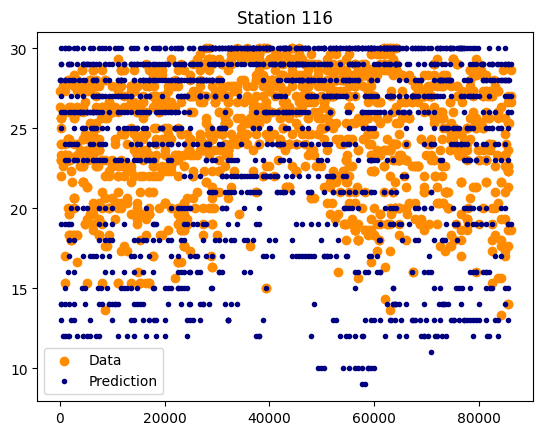

15.918611609814482
<class 'pandas.core.frame.DataFrame'> 1671 1671


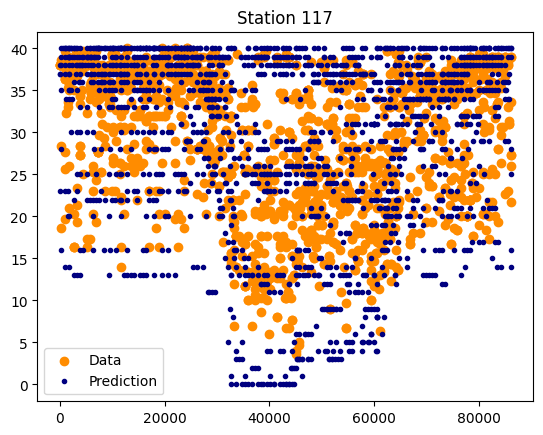

In [14]:
predictions = []
per = []
with PdfPages('station_plots.pdf') as pdf:
    for num in station_number:
        x_set_num = x_set.loc[x_set['number'] == num]
        y_set_num = y_set[x_set['number'] == num]
        x_set_num.drop('number',axis=1)
        #scaler = StandardScaler()
        #x_scaled = scaler.fit_transform(x_set_num)
        #print(x_set_num.shape[0])
        highest  = y_set_num.max()
        x_train, x_test, y_train, y_test = train_test_split(x_set_num, y_set_num, test_size=0.33, random_state=42)
        neigh = KNeighborsRegressor(3)
        neigh.fit(x_train, y_train)
        y_pred = neigh.predict(x_test)
        #predictions[num] = y_pred
        count = 0
        for i in range(len(y_pred)):
            if abs(y_pred[i] - y_test.iloc[i]) <= 1:
                count += 1
        print(count / len(y_pred) * 100)
        print(type(x_test),y_pred.size,y_test.shape[0])
        per.append(count / len(y_pred) * 100)
        plt.figure()
        plt.scatter(x_test['time_as_fraction'], y_pred, color="darkorange", label="Data")
        plt.plot(x_test['time_as_fraction'], y_test.to_numpy(), 'o', color="navy", label="Prediction", markersize=3)
        plt.axis("tight")
        plt.title(f"Station {num}")
        plt.legend()
        pdf.savefig()
        plt.show()

In [5]:

predictions = {}
for num in station_number:
    x_set_num = x_set.loc[x_set['number'] == num]
    y_set_num = y_set[x_set['number'] == num]
    #print(x_set_num.shape[0])
    x_train, x_test, y_train, y_test = train_test_split(x_set, y_set, test_size=0.33, random_state=42)
    neigh = KNeighborsRegressor(n_neighbors=2)
    neigh.fit(x_train, y_train)
    y_pred = neigh.predict(x_test)
    predictions[num] = y_pred
    count = 0
    for i in range(len(y_pred)):
        if abs(y_pred[i] - y_test.iloc[i]) <= 1:
            count += 1
    print(count / len(y_pred) * 100)



12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732104447
12.550973732

In [6]:
models = {}

for station in station_number:
    df_station = df[df["number"] == station]

    X = df_station[['number','time_as_fraction','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
    X = X.drop('number',axis=1)
    y = df_station["available_bikes"]

    # Preprocess the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=0.2, random_state=42
    )

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Station {station} - Mean Squared Error: {mse}, R^2 Score: {r2}")
    count = 0
    for i in range(len(y_pred)):
        if abs(y_pred[i] - y_test.iloc[i]) <= 1:
            count += 1
    print(count / len(y_pred) * 100)

Station 1 - Mean Squared Error: 2.788354866494401, R^2 Score: 0.9693454100949566
73.9879414298019
Station 2 - Mean Squared Error: 1.171268151016457, R^2 Score: 0.9501292862629306
84.70474346563408
Station 3 - Mean Squared Error: 1.2313978494623656, R^2 Score: 0.9619928288423639
78.76344086021506
Station 4 - Mean Squared Error: 1.559031945788964, R^2 Score: 0.9437998722781062
83.73668925459826
Station 5 - Mean Squared Error: 5.438862559241707, R^2 Score: 0.9719807835821759
67.21958925750396
Station 6 - Mean Squared Error: 0.8689161168708764, R^2 Score: 0.9623585586428722
79.17059377945334
Station 7 - Mean Squared Error: 2.918590998043053, R^2 Score: 0.9478970630057361
80.91976516634051
Station 8 - Mean Squared Error: 4.340398009950249, R^2 Score: 0.9308164816053934
68.24212271973465
Station 9 - Mean Squared Error: 3.7358472553699276, R^2 Score: 0.928840158402758
66.34844868735084
Station 10 - Mean Squared Error: 1.5898059964726632, R^2 Score: 0.915041689368462
77.07231040564373
Station 

In [7]:



X = df[['number','time_as_fraction','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like']]
X = X.drop('number',axis=1)
y = df["available_bikes"]

    # Preprocess the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled=pd.DataFrame(X_scaled)
print(X_scaled)
X_scaled.describe()


               0         1         2         3         4         5         6  \
0       1.352804 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
1       1.327912 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
2       1.303020 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
3       1.278129 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
4       1.253237 -0.380172 -0.396521 -0.450132 -0.449363  2.310536 -0.375246   
...          ...       ...       ...       ...       ...       ...       ...   
622716  1.564385 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622717  1.539493 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622718  1.514601 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622719  1.489710 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   
622720  1.464818 -0.380172  2.521936 -0.450132 -0.449363 -0.432800 -0.375246   

               7         8         9  


,0,1,2,3,4,5,6,7,8,9
count,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05,6.227210e+05
mean,6.273378e-17,-4.633719e-17,1.262663e-16,1.549974e-16,-1.149701e-16,-6.143300e-17,1.606797e-16,-1.479458e-16,-1.294387e-14,-2.352026e-15
std,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00,1.000001e+00
min,-1.820911e+00,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,-2.663719e+00,-2.670469e+00
25%,-8.252354e-01,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,-6.154552e-01,-6.990682e-01
50%,2.108857e-02,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,-6.346545e-02,-1.809277e-01
75%,8.300747e-01,-3.801723e-01,-3.965208e-01,-4.501324e-01,-4.493633e-01,-4.327999e-01,-3.752456e-01,-3.695818e-01,6.829357e-01,8.948306e-01
max,1.751074e+00,2.630386e+00,2.521936e+00,2.221569e+00,2.225371e+00,2.310536e+00,2.664921e+00,2.705761e+00,2.325018e+00,2.192649e+00


In [8]:
sum(per)/len(per)

15.895744875797861

In [9]:
print(per)

[8.98172323759791, 22.991202346041057, 14.603691639522259, 15.610328638497654, 10.82375478927203, 18.617932609937178, 8.956109134045077, 12.619406737053795, 13.06024096385542, 21.711229946524064, 33.908387864366446, 23.00357568533969, 26.545454545454543, 12.589194699286443, 29.20094007050529, 15.011037527593817, 35.304553518628026, 15.287588294651865, 20.097323600973237, 29.241459177764913, 11.157674174960713, 12.956298200514137, 15.641569459172851, 15.357502517623365, 16.550522648083625, 16.213214880621877, 20.724560468833246, 12.035010940919037, 10.080645161290322, 28.94572676232065, 13.780551222048881, 13.015399900645802, 16.65884561238855, 11.454809086515224, 9.015971148892325, 11.87953151143335, 24.628712871287128, 12.726382770435634, 22.797131147540984, 13.259376650818805, 20.082693443591257, 15.62829989440338, 12.908496732026146, 19.07481439177613, 10.266591038003403, 32.10621605310803, 9.14007571660357, 9.040959040959041, 8.204334365325078, 14.496169711255154, 15.15723270440251